# ISIC 2024 Challenge

This notebook contains the data preparation, processing and modelling solution of the IsIcTeam2024 team.

2024 © IsIcTeam2024

Install extra dependencies.

In [1]:
!pip install pytorch-lightning --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 14.4 MB/s eta 0:00:00


Download files from DropBox (zip) and unzip files from challenge data zip.

In [ ]:
!wget 'https://www.dropbox.com/scl/fi/nd3x002tfqpvq9p7a5kar/isic-2024-challenge.zip?rlkey=rvr8qmbucjixcika1ivtfmg0x&st=evoaocyt&dl=0' -O isic-2024-challenge.zip

--2024-11-17 07:29:41--  https://www.dropbox.com/scl/fi/nd3x002tfqpvq9p7a5kar/isic-2024-challenge.zip?rlkey=rvr8qmbucjixcika1ivtfmg0x&st=uh84g4ip&dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.18, 2620:100:6017:18::a27d:212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ucb11444e58395f7de5c3bea3d87.dl.dropboxusercontent.com/cd/0/inline/CejQ0zcS_gNhqZhBl5kiuo2LiHWtJ482dLwI4Lk-lUOfxXex20C4jhXNbczpYK1ZG2xMA_jgAnkUfVKdp27UD-klbqu2-1DRJPUC0xoiTqHcVwErVMxdH-v_bkJEsGeC_ygf4gzES6mbcfMIKmApjF40/file# [following]
--2024-11-17 07:29:41--  https://ucb11444e58395f7de5c3bea3d87.dl.dropboxusercontent.com/cd/0/inline/CejQ0zcS_gNhqZhBl5kiuo2LiHWtJ482dLwI4Lk-lUOfxXex20C4jhXNbczpYK1ZG2xMA_jgAnkUfVKdp27UD-klbqu2-1DRJPUC0xoiTqHcVwErVMxdH-v_bkJEsGeC_ygf4gzES6mbcfMIKmApjF40/file
Resolving ucb11444e58395f7de5c3bea3d87.dl.dropboxusercontent.com (ucb11444e58395f7de5c3bea3d87.dl.dropboxusercontent.

In [3]:
!unzip -o '/content/isic-2024-challenge.zip' -d /content/data

A streamkimeneten csak az utolsó 5000 sor látható.
  inflating: /content/data/train-image/image/ISIC_9874656.jpg  
  inflating: /content/data/train-image/image/ISIC_9874659.jpg  
  inflating: /content/data/train-image/image/ISIC_9874663.jpg  
  inflating: /content/data/train-image/image/ISIC_9874742.jpg  
  inflating: /content/data/train-image/image/ISIC_9874751.jpg  
  inflating: /content/data/train-image/image/ISIC_9874803.jpg  
  inflating: /content/data/train-image/image/ISIC_9874805.jpg  
  inflating: /content/data/train-image/image/ISIC_9874832.jpg  
  inflating: /content/data/train-image/image/ISIC_9874878.jpg  
  inflating: /content/data/train-image/image/ISIC_9874897.jpg  
  inflating: /content/data/train-image/image/ISIC_9874925.jpg  
  inflating: /content/data/train-image/image/ISIC_9874931.jpg  
  inflating: /content/data/train-image/image/ISIC_9874939.jpg  
  inflating: /content/data/train-image/image/ISIC_9874940.jpg  
  inflating: /content/data/train-image/image/ISIC_987

Import modules to visualize and preprocess data, use pandas to show metadata in table. Use cv2 to manipulate image.

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import h5py
import cv2

Load the train data (we will use as a train/valid/test, because we don't have test dataset). The original test dataset contains only 3 element (we don't have the target value for them).

In [5]:
BASE_PATH = '/content/data'
train_metadata = pd.read_csv(f'{BASE_PATH}/train-metadata.csv')
train_metadata.head()

<ipython-input-5-c2a95da5e96c>:2: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_metadata = pd.read_csv(f'{BASE_PATH}/train-metadata.csv')


,isic_id,target,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,image_type,tbp_tile_type,tbp_lv_A,...,lesion_id,iddx_full,iddx_1,iddx_2,iddx_3,iddx_4,iddx_5,mel_mitotic_index,mel_thick_mm,tbp_lv_dnn_lesion_confidence
0,ISIC_0015670,0,IP_1235828,60.0,male,lower extremity,3.04,TBP tile: close-up,3D: white,20.244422,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,97.517282
1,ISIC_0015845,0,IP_8170065,60.0,male,head/neck,1.10,TBP tile: close-up,3D: white,31.712570,...,IL_6727506,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,3.141455
2,ISIC_0015864,0,IP_6724798,60.0,male,posterior torso,3.40,TBP tile: close-up,3D: XP,22.575830,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,99.804040
3,ISIC_0015902,0,IP_4111386,65.0,male,anterior torso,3.22,TBP tile: close-up,3D: XP,14.242329,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,99.989998
4,ISIC_0024200,0,IP_8313778,55.0,male,anterior torso,2.73,TBP tile: close-up,3D: white,24.725520,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,70.442510


Show metadata details (numeric only)

In [6]:
train_metadata.describe()

,target,age_approx,clin_size_long_diam_mm,tbp_lv_A,tbp_lv_Aext,tbp_lv_B,tbp_lv_Bext,tbp_lv_C,tbp_lv_Cext,tbp_lv_H,...,tbp_lv_radial_color_std_max,tbp_lv_stdL,tbp_lv_stdLExt,tbp_lv_symm_2axis,tbp_lv_symm_2axis_angle,tbp_lv_x,tbp_lv_y,tbp_lv_z,mel_thick_mm,tbp_lv_dnn_lesion_confidence
count,401059.000000,398261.000000,401059.000000,401059.000000,401059.000000,401059.000000,401059.000000,401059.000000,401059.000000,401059.000000,...,401059.000000,401059.000000,401059.000000,401059.000000,401059.000000,401059.000000,401059.000000,401059.000000,63.000000,4.010590e+05
mean,0.000980,58.012986,3.930827,19.974007,14.919247,28.281706,26.913015,34.786341,30.921279,54.653689,...,1.016459,2.715190,2.238605,0.306823,86.332073,-3.091862,1039.598221,55.823389,0.670952,9.716220e+01
std,0.031288,13.596165,1.743068,3.999489,3.529384,5.278676,4.482994,5.708469,4.829345,5.520849,...,0.734631,1.738165,0.623884,0.125038,52.559511,197.257995,409.819653,87.968245,0.792798,8.995782e+00
min,0.000000,5.000000,1.000000,-2.487115,-9.080269,-0.730989,9.237066,3.054228,11.846520,-1.574164,...,0.000000,0.268160,0.636247,0.052034,0.000000,-624.870728,-1052.134000,-291.890442,0.200000,1.261082e-16
25%,0.000000,50.000000,2.840000,17.330821,12.469740,24.704372,23.848125,31.003148,27.658285,51.566273,...,0.563891,1.456570,1.834745,0.211429,40.000000,-147.022125,746.519673,-8.962647,0.300000,9.966882e+01
50%,0.000000,60.000000,3.370000,19.801910,14.713930,28.171570,26.701704,34.822580,30.804893,55.035632,...,0.902281,2.186693,2.149758,0.282297,90.000000,-5.747253,1172.803000,67.957947,0.400000,9.999459e+01
75%,0.000000,70.000000,4.380000,22.304628,17.137175,31.637429,29.679913,38.430298,33.963868,58.298184,...,1.334523,3.474565,2.531443,0.382022,130.000000,140.474835,1342.131540,126.611567,0.600000,9.999996e+01
max,1.000000,85.000000,28.400000,48.189610,37.021680,54.306900,48.372700,58.765170,54.305290,105.875784,...,11.491140,17.563650,25.534791,0.977055,175.000000,614.471700,1887.766846,319.407000,5.000000,1.000000e+02


Show metadata details (categorical only)

In [7]:
train_metadata.describe(include='O')

,isic_id,patient_id,sex,anatom_site_general,image_type,tbp_tile_type,tbp_lv_location,tbp_lv_location_simple,attribution,copyright_license,lesion_id,iddx_full,iddx_1,iddx_2,iddx_3,iddx_4,iddx_5,mel_mitotic_index
count,401059,401059,389542,395303,401059,401059,401059,401059,401059,401059,22058,401059,401059,1068,1065,551,1,53
unique,401059,1042,2,5,1,2,21,8,7,3,22058,52,3,14,25,26,1,7
top,ISIC_9999967,IP_1117889,male,posterior torso,TBP tile: close-up,3D: XP,Torso Back Top Third,Torso Back,Memorial Sloan Kettering Cancer Center,CC-BY,IL_9852274,Benign,Benign,Benign melanocytic proliferations,Nevus,"Nevus, Atypical, Dysplastic, or Clark","Blue nevus, Cellular",0/mm^2
freq,1,9184,265546,121902,401059,285903,71112,121902,129068,188812,1,399991,400552,443,443,228,1,22


In [8]:
train_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401059 entries, 0 to 401058
Data columns (total 55 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   isic_id                       401059 non-null  object 
 1   target                        401059 non-null  int64  
 2   patient_id                    401059 non-null  object 
 3   age_approx                    398261 non-null  float64
 4   sex                           389542 non-null  object 
 5   anatom_site_general           395303 non-null  object 
 6   clin_size_long_diam_mm        401059 non-null  float64
 7   image_type                    401059 non-null  object 
 8   tbp_tile_type                 401059 non-null  object 
 9   tbp_lv_A                      401059 non-null  float64
 10  tbp_lv_Aext                   401059 non-null  float64
 11  tbp_lv_B                      401059 non-null  float64
 12  tbp_lv_Bext                   401059 non-nul

Fill NA values with pandas.ffill method

In [9]:
train_metadata.ffill(inplace=True)

In [10]:
train_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401059 entries, 0 to 401058
Data columns (total 55 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   isic_id                       401059 non-null  object 
 1   target                        401059 non-null  int64  
 2   patient_id                    401059 non-null  object 
 3   age_approx                    401059 non-null  float64
 4   sex                           401059 non-null  object 
 5   anatom_site_general           401059 non-null  object 
 6   clin_size_long_diam_mm        401059 non-null  float64
 7   image_type                    401059 non-null  object 
 8   tbp_tile_type                 401059 non-null  object 
 9   tbp_lv_A                      401059 non-null  float64
 10  tbp_lv_Aext                   401059 non-null  float64
 11  tbp_lv_B                      401059 non-null  float64
 12  tbp_lv_Bext                   401059 non-nul

Show histrogram of target, age_approx, sex and anatom_site_general features on a plot. We can see that the most of data is negative. We use log scale on y axis.

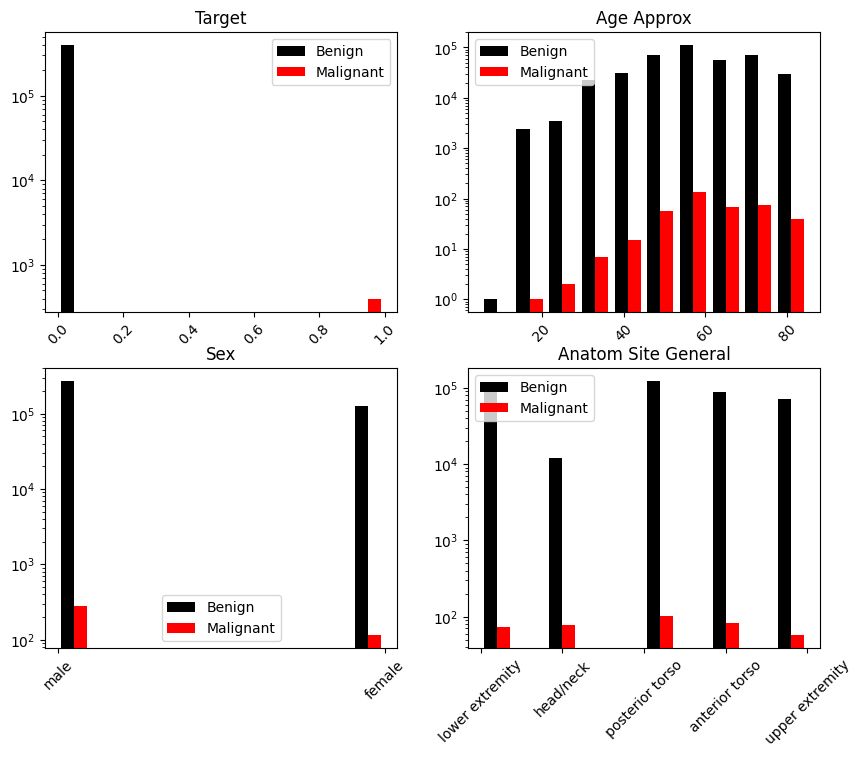

In [11]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

for ax, attribute in zip(axs.ravel(), ['target', 'age_approx', 'sex', 'anatom_site_general']):
  ax.set_title(attribute.replace('_', ' ').title())
  ax.hist(
      [train_metadata[train_metadata.target == 0][attribute], train_metadata[train_metadata.target == 1][attribute]],
      color=['Black', 'Red'],
      log=True
  )
  ax.legend(labels=['Benign', 'Malignant'])
  ax.tick_params(axis='x', rotation=45)

plt.show()

In [12]:
# Categorical features which will be one hot encoded
CATEGORICAL_COLUMNS = ["sex", "anatom_site_general",
            "tbp_tile_type","tbp_lv_location", ]

# Numeraical features which will be normalized
NUMERIC_COLUMNS = ["age_approx", "tbp_lv_nevi_confidence", "clin_size_long_diam_mm",
           "tbp_lv_areaMM2", "tbp_lv_area_perim_ratio", "tbp_lv_color_std_mean",
           "tbp_lv_deltaLBnorm", "tbp_lv_minorAxisMM", ]

# Tabular feature columns
FEAT_COLS = CATEGORICAL_COLUMNS + NUMERIC_COLUMNS

From categorical data we create dummies to encode them, we drop the first value from the dummies.

In [13]:
train_metadata = train_metadata.loc[:, [*FEAT_COLS, 'target', 'patient_id', 'isic_id']]
train_metadata = pd.get_dummies(train_metadata, columns=CATEGORICAL_COLUMNS, drop_first=True)

In [14]:
train_metadata.head()

,age_approx,tbp_lv_nevi_confidence,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_area_perim_ratio,tbp_lv_color_std_mean,tbp_lv_deltaLBnorm,tbp_lv_minorAxisMM,target,patient_id,...,tbp_lv_location_Right Leg - Lower,tbp_lv_location_Right Leg - Upper,tbp_lv_location_Torso Back,tbp_lv_location_Torso Back Bottom Third,tbp_lv_location_Torso Back Middle Third,tbp_lv_location_Torso Back Top Third,tbp_lv_location_Torso Front,tbp_lv_location_Torso Front Bottom Half,tbp_lv_location_Torso Front Top Half,tbp_lv_location_Unknown
0,60.0,2.628592e-03,3.04,3.152561,27.476170,0.00000,5.784302,1.543016,0,IP_1235828,...,False,True,False,False,False,False,False,False,False,False
1,60.0,1.334303e-07,1.10,0.919497,12.235290,0.00000,4.987244,0.821918,0,IP_8170065,...,False,False,False,False,False,False,False,False,False,False
2,60.0,2.959177e-04,3.40,3.265153,24.184620,0.00000,6.290359,1.194905,0,IP_6724798,...,False,False,False,False,False,True,False,False,False,False
3,65.0,2.198945e+01,3.22,6.079940,14.889242,0.51452,6.400196,2.481328,0,IP_4111386,...,False,False,False,False,False,False,False,False,True,False
4,55.0,1.378832e-03,2.73,2.101708,19.902560,0.00000,6.531302,0.929916,0,IP_8313778,...,False,False,False,False,False,False,False,False,True,False


In [15]:
print("Class Distribution Before Sampling (%):")
display(train_metadata.target.value_counts(normalize=True)*100, train_metadata.target.value_counts())

Class Distribution Before Sampling (%):


,proportion
target,
0,99.902009
1,0.097991


,count
target,
0,400666
1,393


Load and plot sample images from positive data.

In [16]:
training_validation_hdf5 = h5py.File(f"{BASE_PATH}/train-image.hdf5", 'r')

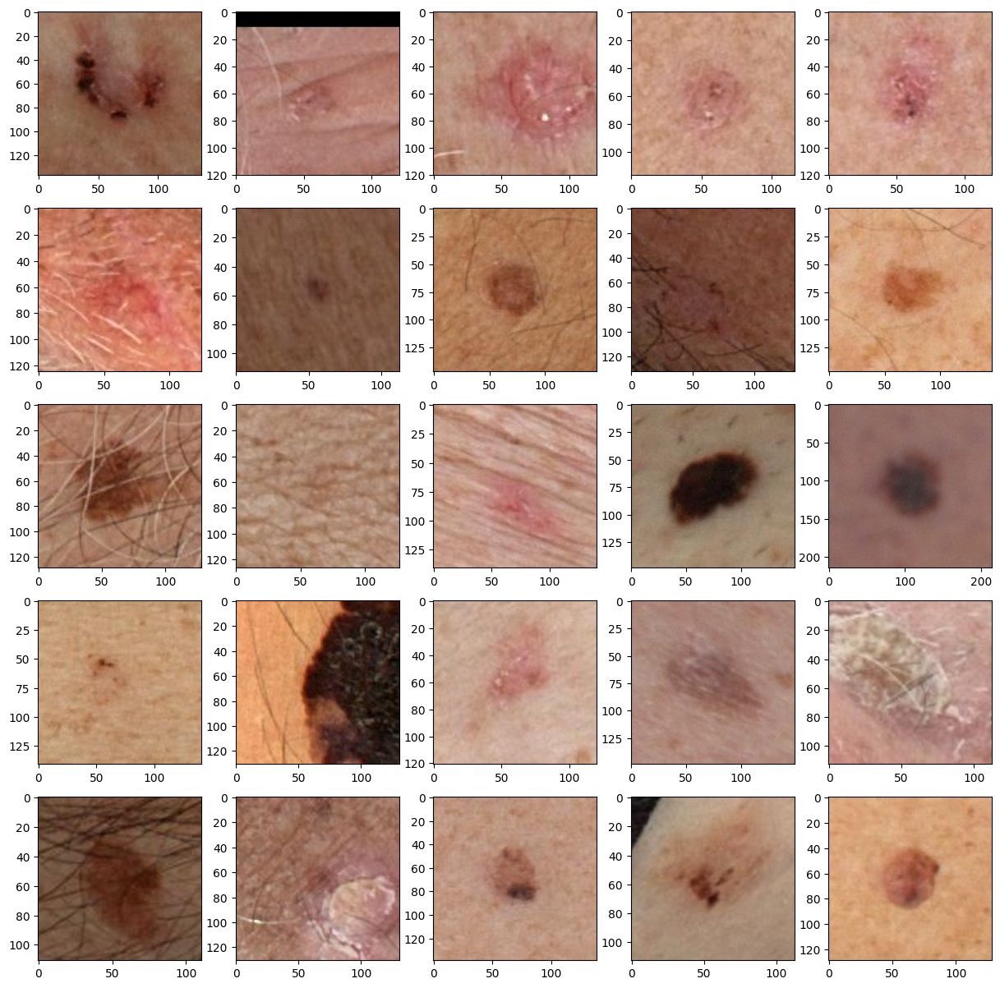

In [17]:
fig, axs = plt.subplots(5, 5, figsize=(15, 15))

for ax, isic_id in zip(axs.ravel(), train_metadata[train_metadata.target == 1].isic_id.iloc[:25]):
  # Image as Byte String
  byte_string = training_validation_hdf5[isic_id][()]

  # Convert byte string to numpy array
  nparr = np.frombuffer(byte_string, np.uint8)

  image = cv2.imdecode(nparr, cv2.IMREAD_COLOR)[...,::-1] # reverse last axis for bgr -> rgb
  ax.imshow(image)
plt.show()

Sample 75-75 positive and negative data for test dataset

In [18]:
selected_positive_test = train_metadata[train_metadata.target == 1].sample(75, random_state=42).reset_index(drop=True)
selelected_negative_test = train_metadata[train_metadata.target == 0].sample(75, random_state=42).reset_index(drop=True)

In [19]:
test_metadata = pd.concat([selected_positive_test, selelected_negative_test]).sample(frac = 1, random_state=42).reset_index(drop=True)
test_metadata.head()

,age_approx,tbp_lv_nevi_confidence,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_area_perim_ratio,tbp_lv_color_std_mean,tbp_lv_deltaLBnorm,tbp_lv_minorAxisMM,target,patient_id,...,tbp_lv_location_Right Leg - Lower,tbp_lv_location_Right Leg - Upper,tbp_lv_location_Torso Back,tbp_lv_location_Torso Back Bottom Third,tbp_lv_location_Torso Back Middle Third,tbp_lv_location_Torso Back Top Third,tbp_lv_location_Torso Front,tbp_lv_location_Torso Front Bottom Half,tbp_lv_location_Torso Front Top Half,tbp_lv_location_Unknown
0,60.0,0.000007,1.53,1.576281,13.405102,0.000000,4.013545,1.171061,1,IP_0698187,...,False,False,False,False,False,False,False,False,False,False
1,65.0,73.616195,12.89,101.482454,19.079606,2.631318,11.309025,10.080681,1,IP_3232631,...,True,False,False,False,False,False,False,False,False,False
2,60.0,17.128910,3.01,5.197973,14.918660,0.802362,6.866282,2.191781,0,IP_9526638,...,False,False,False,False,True,False,False,False,False,False
3,85.0,75.831120,2.52,3.115031,13.763510,0.652644,8.513734,1.549823,0,IP_9726832,...,False,False,False,False,False,False,False,True,False,False
4,55.0,0.000001,3.30,4.728842,19.874324,0.461697,5.530585,2.056787,0,IP_2331257,...,False,False,False,False,False,False,False,False,False,False


Remove selected test data from train_metadata

In [20]:
train_val_metadata = train_metadata[~train_metadata.isic_id.isin([*selected_positive_test.isic_id, *selelected_negative_test.isic_id])]

In [21]:
print("Class Distribution Before Sampling In Train/Val:")
display(train_val_metadata.target.value_counts())

Class Distribution Before Sampling In Train/Val:


,count
target,
0,400591
1,318


Sample 75-75 positive and negative data for validation dataset

In [22]:
selected_positive_val = train_val_metadata[train_val_metadata.target == 1].sample(75, random_state=42).reset_index(drop=True)
selelected_negative_val = train_val_metadata[train_val_metadata.target == 0].sample(75, random_state=42).reset_index(drop=True)

In [23]:
val_metadata = pd.concat([selected_positive_val, selelected_negative_val]).sample(frac = 1, random_state=42).reset_index(drop=True)
val_metadata.head()

,age_approx,tbp_lv_nevi_confidence,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_area_perim_ratio,tbp_lv_color_std_mean,tbp_lv_deltaLBnorm,tbp_lv_minorAxisMM,target,patient_id,...,tbp_lv_location_Right Leg - Lower,tbp_lv_location_Right Leg - Upper,tbp_lv_location_Torso Back,tbp_lv_location_Torso Back Bottom Third,tbp_lv_location_Torso Back Middle Third,tbp_lv_location_Torso Back Top Third,tbp_lv_location_Torso Front,tbp_lv_location_Torso Front Bottom Half,tbp_lv_location_Torso Front Top Half,tbp_lv_location_Unknown
0,50.0,0.366743,5.98,11.221620,23.509200,4.834564,13.411240,2.890493,1,IP_8683966,...,False,False,False,False,False,False,False,True,False,False
1,45.0,97.822090,5.91,17.357850,16.526220,2.825198,14.912110,3.684846,1,IP_7299252,...,False,False,False,False,False,True,False,False,False,False
2,50.0,76.941210,3.97,9.532745,16.479900,1.036851,8.491222,3.150685,0,IP_9837962,...,False,False,False,False,False,False,False,False,False,False
3,50.0,99.289739,5.92,17.432914,16.703253,1.929034,10.098641,3.847928,0,IP_0030719,...,False,False,False,False,False,False,False,True,False,False
4,40.0,82.804954,3.21,5.854757,15.051082,1.313961,9.015978,2.339219,0,IP_3815550,...,False,False,False,False,False,False,False,False,False,False


In [24]:
tr_metadata = train_val_metadata[~train_val_metadata.isic_id.isin([*selected_positive_val.isic_id, *selelected_negative_val.isic_id])]

In [25]:
print("Class Distribution Before Sampling In Train/Val:")
display(tr_metadata.target.value_counts())

Class Distribution Before Sampling In Train/Val:


,count
target,
0,400516
1,243


Resample train data to balance train dataset

In [26]:
positive_train = tr_metadata.query("target==0").sample(frac=0.0075, random_state=42)
negative_train = tr_metadata.query("target==1").sample(frac=6.0, replace=True, random_state=42)
resampled_train = pd.concat([positive_train, negative_train], axis=0).sample(frac=1.0)

In [27]:
print("Class Distribution After Resampling In Train:")
display(resampled_train.target.value_counts(normalize=True)*100)

Class Distribution After Resampling In Train:


,proportion
target,
0,67.32407
1,32.67593


In [28]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight('balanced', classes=np.unique(resampled_train['target']), y=resampled_train['target'])
class_weights = dict(enumerate(class_weights))

In [29]:
print("Class Weights:", class_weights)

Class Weights: {0: 0.742676431424767, 1: 1.5301783264746227}


Create train, val and test datasets

In [30]:
train_X = resampled_train.drop(columns=['target', 'patient_id'])
train_y = resampled_train.target.values

val_X = val_metadata.drop(columns=['target', 'patient_id'])
val_y = val_metadata.target.values

test_X = test_metadata.drop(columns=['target', 'patient_id'])
test_y = test_metadata.target.values

If you want to use another solution for image loading, you can copy the selected images from original folder to train/val/test folders (but for this image loader you have to modify the model data load!).

In [31]:
import shutil
import os

IMAGE_FOLDER = '/content/images'

if os.path.exists(IMAGE_FOLDER):
  shutil.rmtree(IMAGE_FOLDER)


def create_sub_folder(df, labels, folder_name):
  os.makedirs(f"{IMAGE_FOLDER}/{folder_name}")
  for isic_id, label in zip(df.isic_id, labels):
    if not os.path.exists(f"{IMAGE_FOLDER}/{folder_name}/{label}"):
      os.makedirs(f"{IMAGE_FOLDER}/{folder_name}/{label}")
    shutil.copy(f"{BASE_PATH}/train-image/image/{isic_id}.jpg", f"{IMAGE_FOLDER}/{folder_name}/{label}/{isic_id}.jpg")

create_sub_folder(train_X, train_y, 'train')
create_sub_folder(val_X, val_y, 'val')
create_sub_folder(test_X, test_y, 'test')

Standardize metadata in numeric columns

In [32]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
train_X[NUMERIC_COLUMNS] = scaler.fit_transform(train_X[NUMERIC_COLUMNS])
val_X[NUMERIC_COLUMNS] = scaler.transform(val_X[NUMERIC_COLUMNS])
test_X[NUMERIC_COLUMNS] = scaler.transform(test_X[NUMERIC_COLUMNS])

In [33]:
train_X.head()

,age_approx,tbp_lv_nevi_confidence,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_area_perim_ratio,tbp_lv_color_std_mean,tbp_lv_deltaLBnorm,tbp_lv_minorAxisMM,isic_id,sex_male,...,tbp_lv_location_Right Leg - Lower,tbp_lv_location_Right Leg - Upper,tbp_lv_location_Torso Back,tbp_lv_location_Torso Back Bottom Third,tbp_lv_location_Torso Back Middle Third,tbp_lv_location_Torso Back Top Third,tbp_lv_location_Torso Front,tbp_lv_location_Torso Front Bottom Half,tbp_lv_location_Torso Front Top Half,tbp_lv_location_Unknown
221957,0.830638,-0.801379,-0.648546,-0.571439,0.140252,-1.170547,-0.662890,-0.918774,ISIC_5580894,True,...,False,False,False,False,False,False,False,False,True,False
113956,-0.710766,1.306273,-0.388492,-0.295329,-0.824846,0.344958,0.228148,-0.177167,ISIC_2898582,True,...,False,False,False,False,False,True,False,False,False,False
154052,0.830638,-0.781874,-1.194659,-0.665982,-1.233651,-1.170547,-1.166880,-1.235783,ISIC_3894462,True,...,False,False,False,False,False,False,False,False,False,False
324402,0.445287,-0.705369,0.688874,0.486803,-0.467768,3.263450,1.034915,0.875731,ISIC_8110460,True,...,False,False,False,False,False,True,False,False,False,False
177577,0.830638,1.674039,-0.537094,-0.484416,-0.566248,-0.473330,0.658094,-0.656666,ISIC_4477880,True,...,False,False,False,False,False,False,False,True,False,False


Test to remove hair from images with [Squeeze algorithm](https://www.mdpi.com/2072-6694/15/1/12).

In [34]:
def remove_hair(image, image_size=(224, 224), filter_size=(5, 5), threshold=5, max_value=255):
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, filter_size)

  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  blackhat_img = cv2.morphologyEx(gray_image,cv2.MORPH_BLACKHAT, kernel)

  _, mask = cv2.threshold(blackhat_img, threshold, max_value, cv2.THRESH_BINARY)

  squeezed_image = cv2.inpaint(image, mask, 3, cv2.INPAINT_NS)

  resized_image = cv2.resize(squeezed_image, image_size, interpolation = cv2.INTER_CUBIC)
  return resized_image


Testing hair removing from images and plot the results.

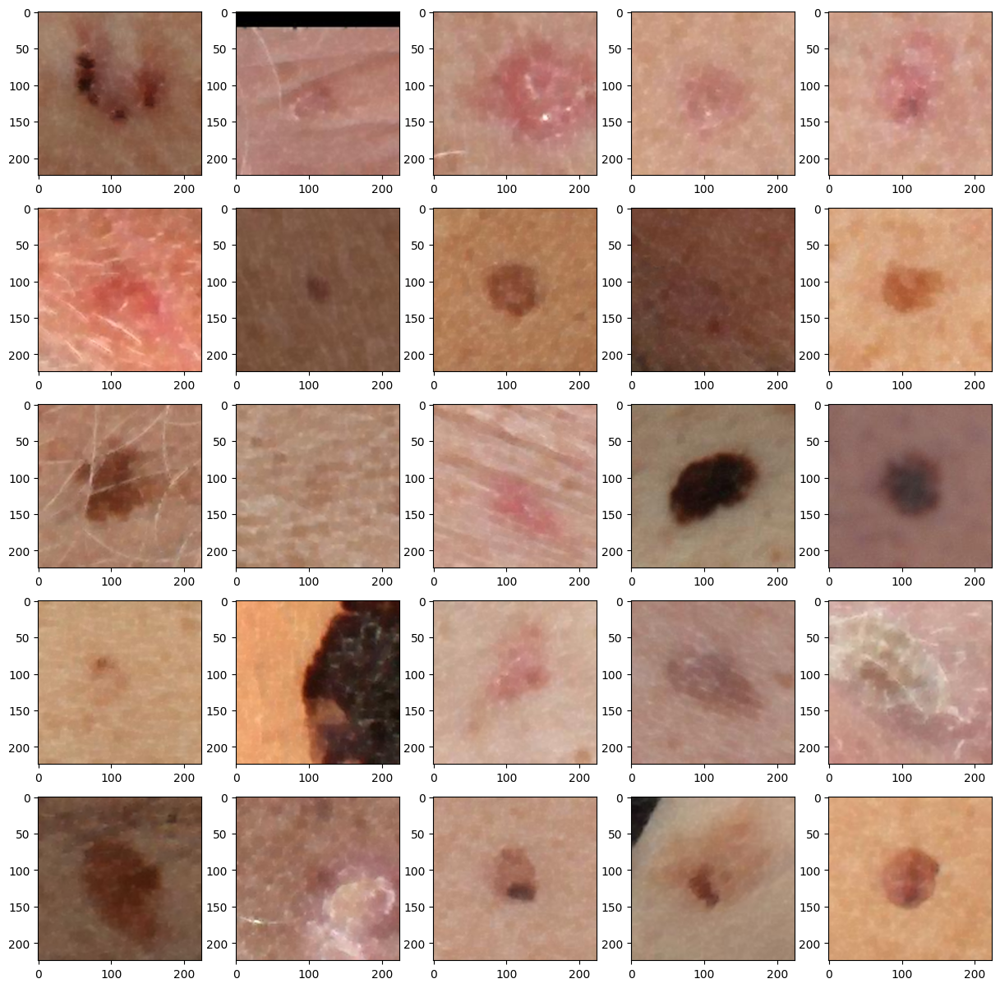

In [35]:
fig, axs = plt.subplots(5, 5, figsize=(15, 15))

for ax, isic_id in zip(axs.ravel(), train_metadata[train_metadata.target == 1].isic_id.iloc[:25]):

  image_string = training_validation_hdf5[isic_id][()]
  image_array = np.frombuffer(image_string, np.uint8)
  image = cv2.imdecode(image_array, cv2.IMREAD_COLOR)[..., ::-1]
  squeezed_image = remove_hair(image)
  ax.imshow(squeezed_image)
plt.show()

Custom dataset to load image from hdf5 and concat with metadata and target value

In [36]:
from torch.utils.data import Dataset
import os
from PIL import Image


class Isic2024Dataset(Dataset):
    def __init__(self, metadata, targets, hdf5, transform=None, remove_hair=False):
        self.isic_ids = metadata.isic_id.values
        self.targets = targets
        self.metadata = metadata.drop(columns = ['isic_id']).values.astype(np.float32)
        self.hdf5 = hdf5
        self.transform = transform
        self.remove_hair = remove_hair

    def __len__(self):
        return len(self.isic_ids)

    def __getitem__(self, idx):
        image_string = self.hdf5[self.isic_ids[idx]][()]
        image_array = np.frombuffer(image_string, np.uint8)
        image_decoded = cv2.imdecode(image_array, cv2.IMREAD_COLOR)[..., ::-1]  # Convert BGR to RGB

        if self.remove_hair:
          image_decoded = remove_hair(image_decoded)

        image = Image.fromarray(image_decoded)

        if self.transform:
            image = self.transform(image)

        return {'image': image, 'metadata': self.metadata[idx], "labels": self.targets[idx]}

Create data module to handle train / val / test dataset during training and testing

In [37]:
import pytorch_lightning as pl
import torchvision.transforms as T
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

BATCH_SIZE = 64

class Isic2024DataModule(pl.LightningDataModule):
    def __init__(self, batch_size=BATCH_SIZE, remove_hair=False, image_size=(224, 224)):
        super().__init__()
        self.train_transform = T.Compose([
            T.Resize(image_size, antialias=True),
            T.RandomHorizontalFlip(),
            T.RandomVerticalFlip(),
            T.RandomRotation(degrees=(0, 180)),
            T.ToTensor(),
            T.Lambda(lambda x: (x * 2) - 1),
            T.RandomErasing(p=0.2),
        ])
        self.val_transform = T.Compose([
            T.Resize(image_size, antialias=True),
            T.ToTensor(),
            T.Lambda(lambda x: (x * 2) - 1),
        ])
        self.inverse_transform = T.Compose([
            T.Lambda(lambda t: (t + 1) / 2),
            T.Lambda(lambda t: t.permute(1, 2, 0)),
            T.Lambda(lambda t: t * 255.),
            T.Lambda(lambda t: t.cpu().numpy().astype(np.uint8)),
            T.ToPILImage(),
        ])

        self.batch_size = batch_size
        self.remove_hair = remove_hair

    def setup(self, stage=None):
        self.train_dataset = Isic2024Dataset(
            train_X, train_y, training_validation_hdf5, transform=self.train_transform, remove_hair=self.remove_hair
        )
        self.val_dataset = Isic2024Dataset(
            val_X, val_y, training_validation_hdf5, transform=self.val_transform, remove_hair=self.remove_hair
        )
        self.test_dataset = Isic2024Dataset(
            test_X, test_y, training_validation_hdf5, transform=self.val_transform, remove_hair=self.remove_hair
        )

    def train_dataloader(self):
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            num_workers=2,
            pin_memory=True,
            drop_last=True,
            shuffle=True,
        )

    def val_dataloader(self):
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            num_workers=2,
            pin_memory=True,
        )

    def test_dataloader(self):
        return DataLoader(
            self.test_dataset,
            batch_size=self.batch_size,
            num_workers=2,
            pin_memory=True,
        )

Prepare data module

In [100]:
data_module = Isic2024DataModule(remove_hair=False)
data_module.prepare_data()
data_module.setup()

Plot the first batch images (first 25 elements), with transformations and hair removing.

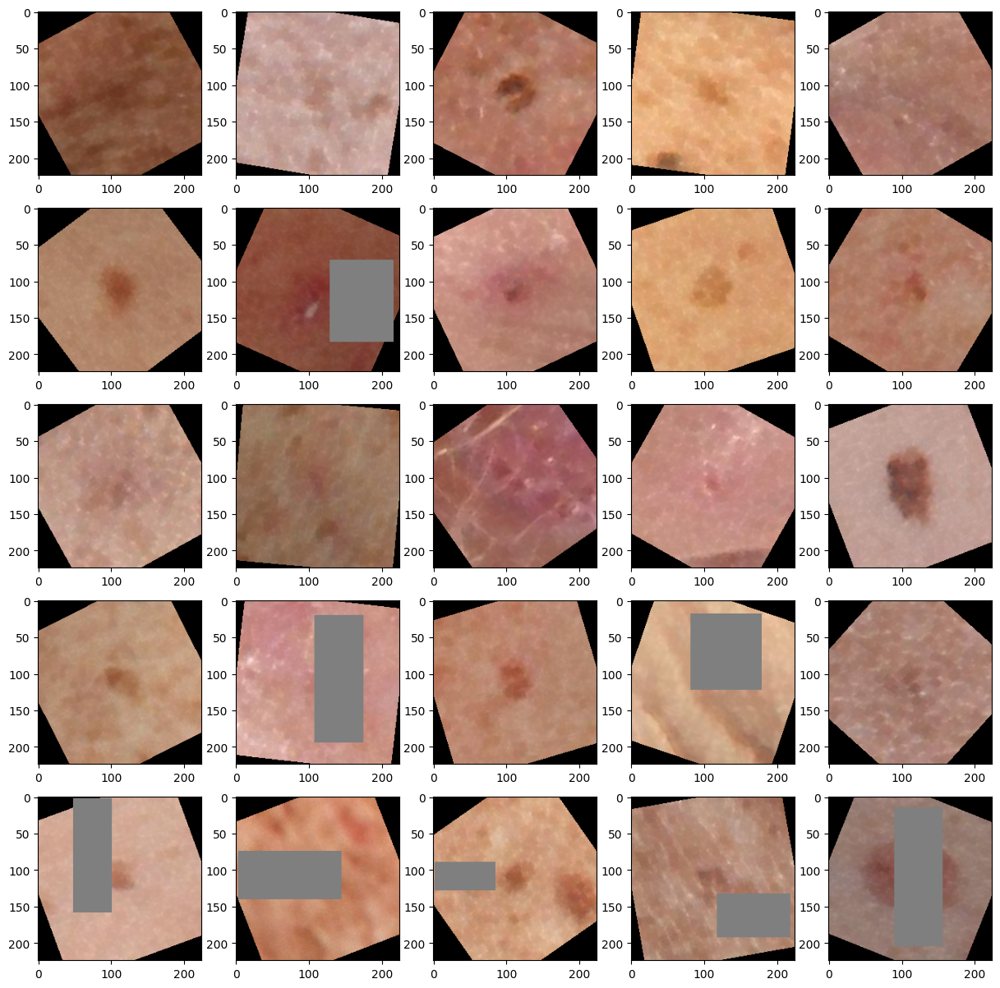

In [80]:
fig, axs = plt.subplots(5, 5, figsize=(15, 15))
for batch in data_module.train_dataloader():
  for ax, image in zip(axs.ravel(), batch['image'][:25]):
    ax.imshow(data_module.inverse_transform(image))
  break
plt.show()

# **OpenAlex based model**
We have read in the articles that it is worth starting with OpenAlexNet, as there was a time when they did well in this task. We added our own classification layer to the model, which performs classification based on the features extracted by the OpenAlexNet model.

In [42]:
from sklearn.metrics import roc_auc_score, f1_score, precision_score, classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
from torchmetrics import ConfusionMatrix, AUROC, F1Score, Precision, Recall

We have implemented the same metrics used in the kaggle competition to evaluate the predictions submitted, which can be found [here](https://www.kaggle.com/code/metric/isic-pauc-abovetpr).
<br/>
<br/>

Quoted from the kaggle competition page:

"*The receiver operating characteristic (ROC) curve illustrates the diagnostic ability of a given binary classifier system as its discrimination threshold is varied. However, there are regions in the ROC space where the values of TPR are unacceptable in clinical practice. Systems that aid in diagnosing cancers are required to be highly-sensitive, so this metric focuses on the area under the ROC curve AND above 80% TRP. Hence, scores range from [0.0, 0.2].*"

<br/>
<br/>

We will therefore also use this metric to compare models.


In [43]:
from torchmetrics import Metric

class pAUC(Metric):
    def __init__(self, min_tpr=0.8, **kwargs):
        super().__init__(**kwargs)
        self.min_tpr = min_tpr
        self.preds = []
        self.target = []

    def update(self, preds: torch.Tensor, target: torch.Tensor):
        self.preds.append(preds)
        self.target.append(target)

    def compute(self):
        preds = torch.cat(self.preds).cpu().numpy()
        target = torch.cat(self.target).cpu().numpy()

        # rescale the target. set 0s to 1s and 1s to 0s (since sklearn only has max_fpr)
        v_gt = abs(target - 1)
        # flip the submissions to their compliments
        v_pred = -1.0 * preds

        max_fpr = abs(1 - self.min_tpr)

        # using sklearn.metric functions: (1) roc_curve and (2) auc
        fpr, tpr, _ = roc_curve(v_gt, v_pred, sample_weight=None)
        if max_fpr is None or max_fpr == 1:
            return auc(fpr, tpr)
        if max_fpr <= 0 or max_fpr > 1:
            return -1

        # Add a single point at max_fpr by linear interpolation
        stop = np.searchsorted(fpr, max_fpr, "right")
        x_interp = [fpr[stop - 1], fpr[stop]]
        y_interp = [tpr[stop - 1], tpr[stop]]
        tpr = np.append(tpr[:stop], np.interp(max_fpr, x_interp, y_interp))
        fpr = np.append(fpr[:stop], max_fpr)
        partial_auc = auc(fpr, tpr)
        self.preds.clear()
        self.target.clear()
        return partial_auc

The basic logistic regression model. <br>
During model training and validation, only the loss function is logged out. When we evaluate test data set, we log the metrics that are valid on unbalanced data set (it is based on [this paper](https://machinelearningmastery.com/5-effective-ways-to-handle-imbalanced-data-in-machine-learning/)). These are:
 * **AUROC** (partial AUC, that the kaggle competition used too)
 * **F1 score**
 * **Precision**
 * Recall
 * Confusion matrix: for visually see the classification

In [56]:
# Import to use OpenAlex model
import torchvision.models as models
from torch import nn
import torch

In [133]:
openalex_model = nn.Sequential(
    models.alexnet(pretrained=False).features,
    nn.AdaptiveAvgPool2d((1, 1)),
    nn.Flatten(),
    nn.Dropout(0.2),
    nn.Linear(256, 256),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(256, 128),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(128, 1)
)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [165]:
mobilnet_model = nn.Sequential(
    models.mobilenet_v3_large(pretrained=False).features,
    nn.AdaptiveAvgPool2d((1, 1)),
    nn.Flatten(),
    nn.Dropout(0.2),
    nn.Linear(960, 256),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(256, 128),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(128, 1)
)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [166]:
class CustomIsIcModule(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.save_hyperparameters()
        self.model = model

        self.BCE = torch.nn.BCELoss()
        self.cm = ConfusionMatrix(task="binary", num_classes=2)
        self.aucroc = AUROC(task="binary", num_classes=2)
        self.f1 = F1Score(task="binary", num_classes=2)
        self.precision = Precision(task="binary", num_classes=2)
        self.recall = Recall(task="binary", num_classes=2)
        self.pAUC = pAUC()

    def forward(self, x):
        out = self.model(x)
        out = torch.nn.functional.sigmoid(out)
        return out

    def training_step(self, batch, batch_idx):
        pred_labels = self.forward(batch['image'])
        loss = self.BCE(pred_labels, batch['labels'].unsqueeze(1).to(torch.float32))
        self.log('train_loss', loss, prog_bar=True, on_epoch=True)
        return loss

    def validation_step(self, batch, batch_idx):
        pred_labels = self.forward(batch['image'])
        reshaped_batch = batch['labels'].unsqueeze(1).to(torch.float32)
        loss = self.BCE(pred_labels, reshaped_batch)
        self.pAUC.update(pred_labels, reshaped_batch)
        self.log('val_loss', loss, prog_bar=True, on_epoch=True)
        return loss

    def on_validation_epoch_end(self) -> None:
        self.log('val_pAUC', self.pAUC.compute(), prog_bar=True, on_epoch=True)
        return super().on_validation_epoch_end()

    def test_step(self, batch, batch_idx):
        pred_labels = self.forward(batch['image'])
        reshaped_batch = batch['labels'].unsqueeze(1).to(torch.float32)
        self.cm.update(pred_labels, reshaped_batch)
        self.aucroc.update(pred_labels, reshaped_batch)
        self.f1.update(pred_labels, reshaped_batch)
        self.precision.update(pred_labels, reshaped_batch)
        self.recall.update(pred_labels, reshaped_batch)
        self.pAUC.update(pred_labels, reshaped_batch)
        loss = self.BCE(pred_labels, reshaped_batch)
        self.log('test_loss', loss, prog_bar=True, on_epoch=True)
        return loss

    def on_test_epoch_end(self) -> None:
        self.cm.plot()
        self.log('test_auc_roc', self.aucroc.compute(), prog_bar=True, on_epoch=True)
        self.log('test_f1', self.f1.compute(), prog_bar=True, on_epoch=True)
        self.log('test_precision', self.precision.compute(), prog_bar=True, on_epoch=True)
        self.log('test_recall', self.recall.compute(), prog_bar=True, on_epoch=True)
        self.log('test_pAUC', self.pAUC.compute(), prog_bar=True, on_epoch=True)
        return super().on_test_epoch_end()

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.002)

Initialize model for training.

In [135]:
model = CustomIsIcModule(model=openalex_model)

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.


In [167]:
model = CustomIsIcModule(model=mobilnet_model)

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.


Create callbacks to save best modell and use Early stopping to avoid overfitting.

In [168]:
model_cpkt = pl.callbacks.ModelCheckpoint(
    monitor='val_pAUC',
    mode='max',
    save_top_k=1,
    save_last=True,
    dirpath='openalex',
    filename='best_model')

early_stopping = pl.callbacks.EarlyStopping(
    monitor='val_pAUC',
    mode='max',
    patience=10,
    verbose=True,
)

Initialize the trainer.

In [169]:
trainer = pl.Trainer(
    max_epochs=100,
    accelerator='gpu' if torch.cuda.is_available() else 'cpu',
    devices=1,
    logger=pl.loggers.tensorboard.TensorBoardLogger(save_dir='logs/', name='openalex'),
    log_every_n_steps=1,
    callbacks=[model_cpkt, early_stopping]
    )

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Training the model.

In [170]:
trainer.fit(model, datamodule=data_module)

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /content/openalex exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type                  | Params | Mode 
------------------------------------------------------------
0 | model     | Sequential            | 3.3 M  | train
1 | BCE       | BCELoss               | 0      | train
2 | cm        | BinaryConfusionMatrix | 0      | train
3 | aucroc    | BinaryAUROC           | 0      | train
4 | f1        | BinaryF1Score         | 0      | train
5 | precision | BinaryPrecision       | 0      | train
6 | recall    | BinaryRecall          | 0      | train
7 | pAUC      | pAUC                  | 0      | train
------------------------------------------------------------
3.3 M     Trainable params
0         Non-trainable params
3.3 M     Total params
13.004    Tota

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_pAUC improved. New best score: 0.047


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_pAUC improved by 0.006 >= min_delta = 0.0. New best score: 0.053


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_pAUC improved by 0.026 >= min_delta = 0.0. New best score: 0.078


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_pAUC improved by 0.052 >= min_delta = 0.0. New best score: 0.130


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_pAUC improved by 0.004 >= min_delta = 0.0. New best score: 0.134


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_pAUC did not improve in the last 10 records. Best score: 0.134. Signaling Trainer to stop.


Load best model from the training.

In [171]:
best_model = CustomIsIcModule.load_from_checkpoint(trainer.checkpoint_callback.best_model_path)

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.


Run test on the model to evalute it's performance.

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_auc_roc        │    0.8378666639328003     │
│          test_f1          │     0.807692289352417     │
│         test_loss         │    0.6224089860916138     │
│         test_pAUC         │    0.09706666320562363    │
│      test_precision       │    0.7777777910232544     │
│        test_recall        │    0.8399999737739563     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.6224089860916138,
  'test_auc_roc': 0.8378666639328003,
  'test_f1': 0.807692289352417,
  'test_precision': 0.7777777910232544,
  'test_recall': 0.8399999737739563,
  'test_pAUC': 0.09706666320562363}]

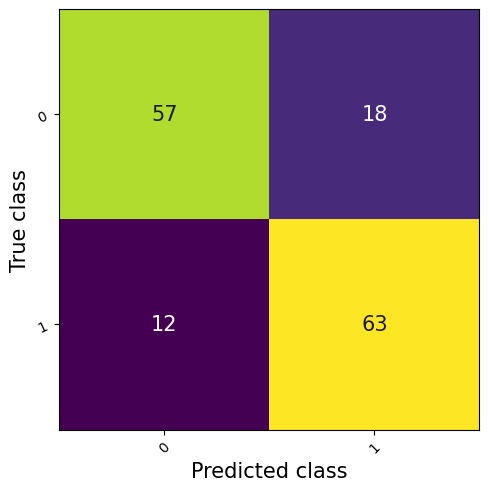

In [172]:
trainer.test(best_model, datamodule=data_module)

We saved some logs during train, validation and test for visualization, and here we plot them.

In [72]:
%load_ext tensorboard

In [173]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>